In [5]:
import pandas as pd
from sklearn.preprocessing import StandardScaler


activation_files = [
    'PPOlayer0.csv',
    'PPOlayer1.csv',
    'PPOlayer2.csv',
    'PPOlayer3.csv',
    'PPOlayer4.csv',
    'PPOlayer5.csv'
]


base_path = '/content/'

# Load, normalize, and save the activation data
for file in activation_files:

    full_path = base_path + file


    activations = pd.read_csv(full_path)

    # Check initial shape of the data
    initial_shape = activations.shape
    print(f"Initial shape for {file}: {initial_shape}")

    # Normalize the activations
    scaler = StandardScaler()
    activations_normalized = scaler.fit_transform(activations)

    # Convert back to DataFrame
    activations_normalized_df = pd.DataFrame(activations_normalized, columns=activations.columns)

    # Save the normalized data to a new file
    normalized_file = base_path + 'normalized_' + file
    activations_normalized_df.to_csv(normalized_file, index=False)

    # Check shape of the normalized data
    normalized_shape = activations_normalized_df.shape
    print(f"Shape after normalization for {file}: {normalized_shape}")

    print(f"Normalized data for {file} saved to {normalized_file}")


Initial shape for PPOlayer0.csv: (1000, 23)
Shape after normalization for PPOlayer0.csv: (1000, 23)
Normalized data for PPOlayer0.csv saved to /content/normalized_PPOlayer0.csv
Initial shape for PPOlayer1.csv: (1000, 64)
Shape after normalization for PPOlayer1.csv: (1000, 64)
Normalized data for PPOlayer1.csv saved to /content/normalized_PPOlayer1.csv
Initial shape for PPOlayer2.csv: (1000, 64)
Shape after normalization for PPOlayer2.csv: (1000, 64)
Normalized data for PPOlayer2.csv saved to /content/normalized_PPOlayer2.csv
Initial shape for PPOlayer3.csv: (1000, 64)
Shape after normalization for PPOlayer3.csv: (1000, 64)
Normalized data for PPOlayer3.csv saved to /content/normalized_PPOlayer3.csv
Initial shape for PPOlayer4.csv: (1000, 64)
Shape after normalization for PPOlayer4.csv: (1000, 64)
Normalized data for PPOlayer4.csv saved to /content/normalized_PPOlayer4.csv
Initial shape for PPOlayer5.csv: (1000, 64)
Shape after normalization for PPOlayer5.csv: (1000, 64)
Normalized data

In [6]:

worm_files = [
    'normalized_Worm1.csv',
    'normalized_Worm2.csv',
    'normalized_Worm3.csv',
    'normalized_Worm4.csv'
]

base_path = '/content/'


for file in worm_files:
    worm_data = pd.read_csv(base_path + file)
    print(f"Shape of {file}: {worm_data.shape}")


Shape of normalized_Worm1.csv: (1554, 56)
Shape of normalized_Worm2.csv: (1145, 77)
Shape of normalized_Worm3.csv: (282, 68)
Shape of normalized_Worm4.csv: (889, 57)


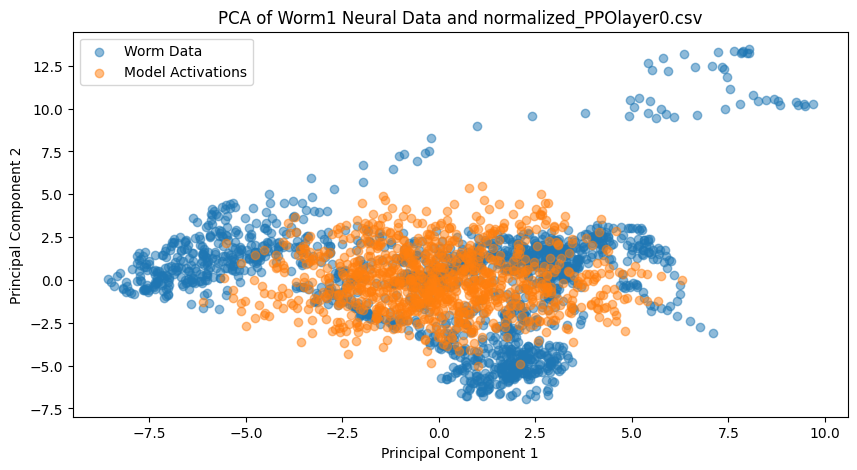

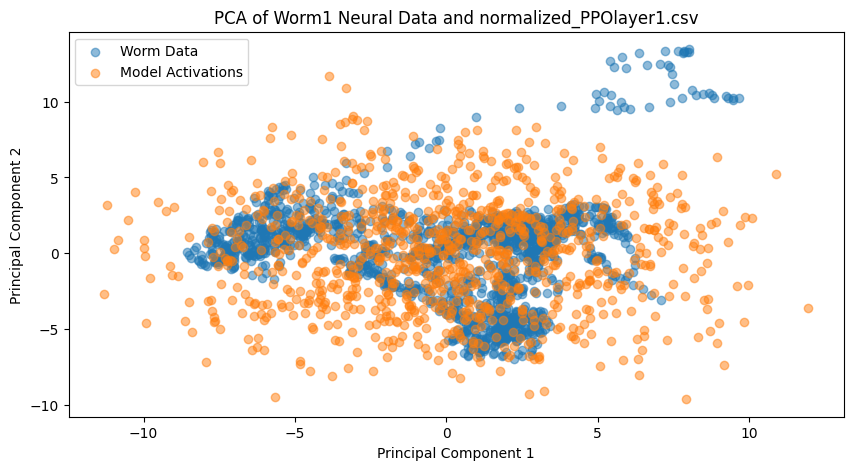

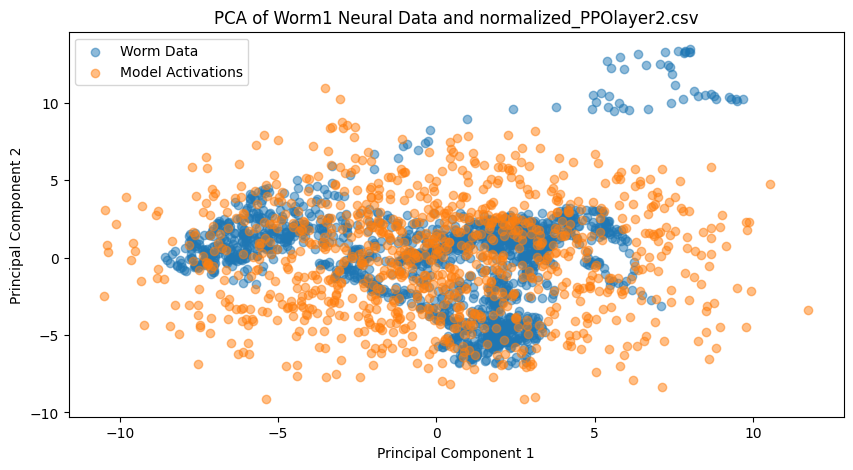

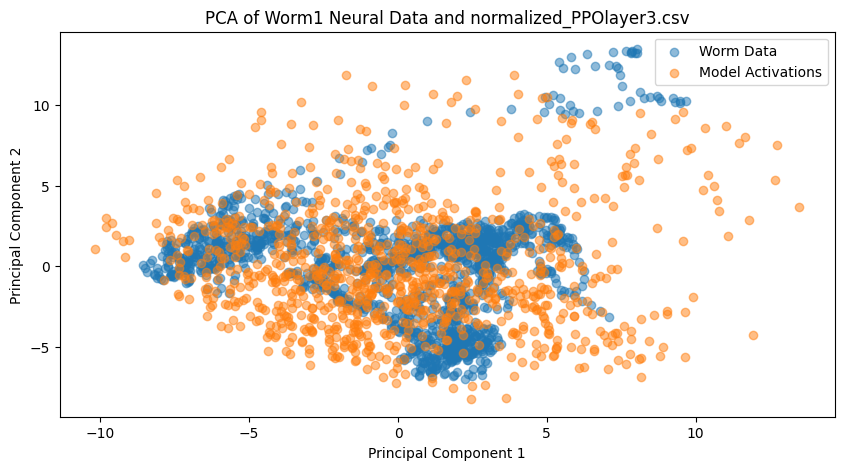

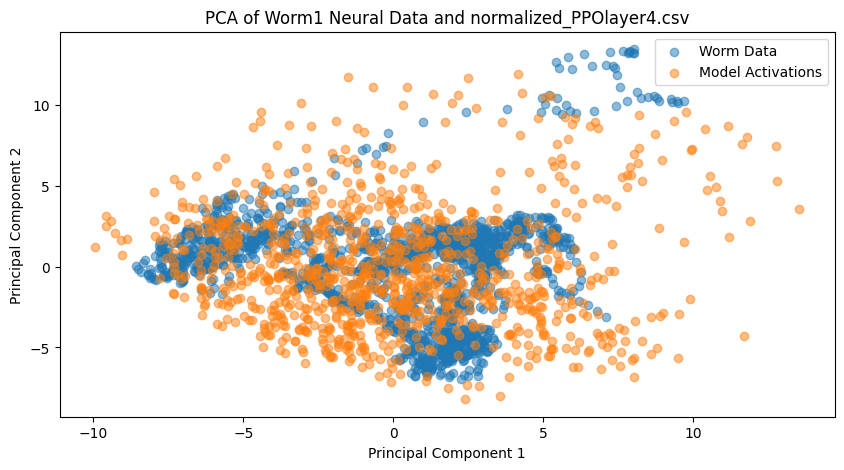

...

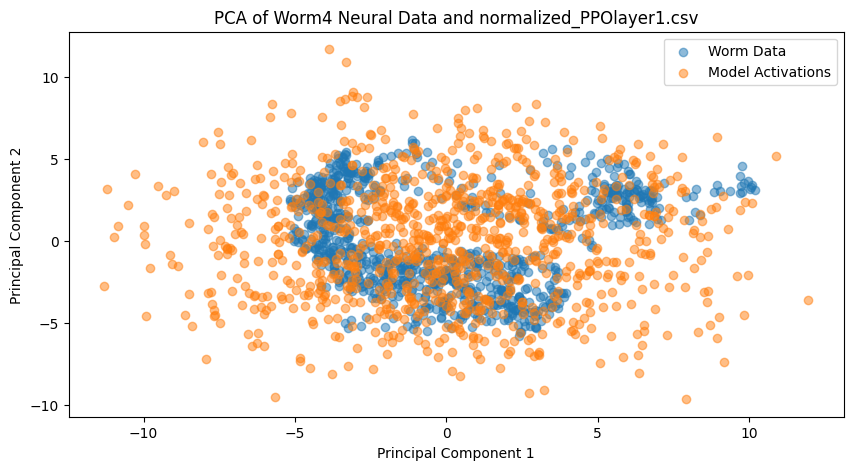

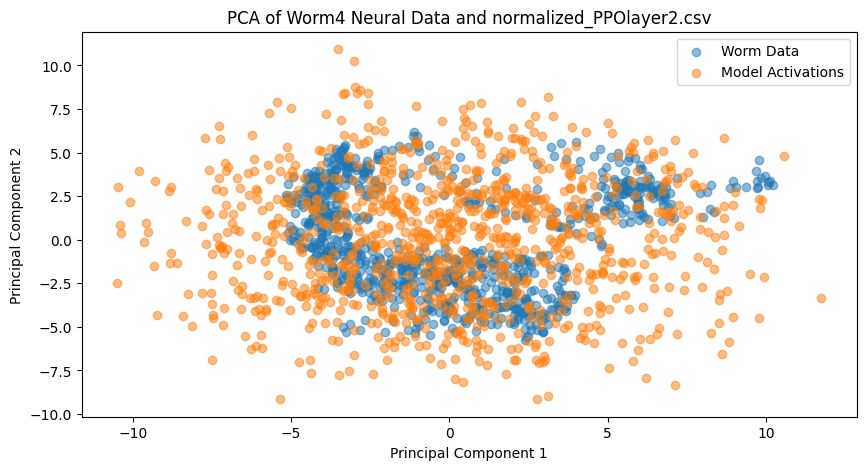

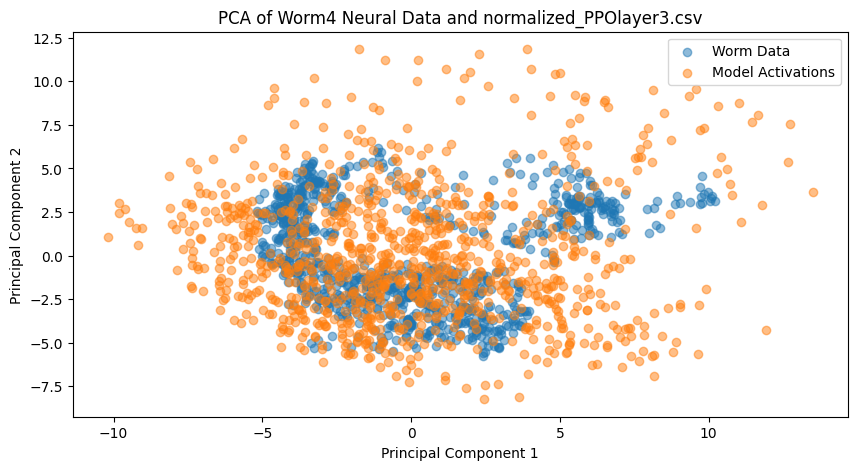

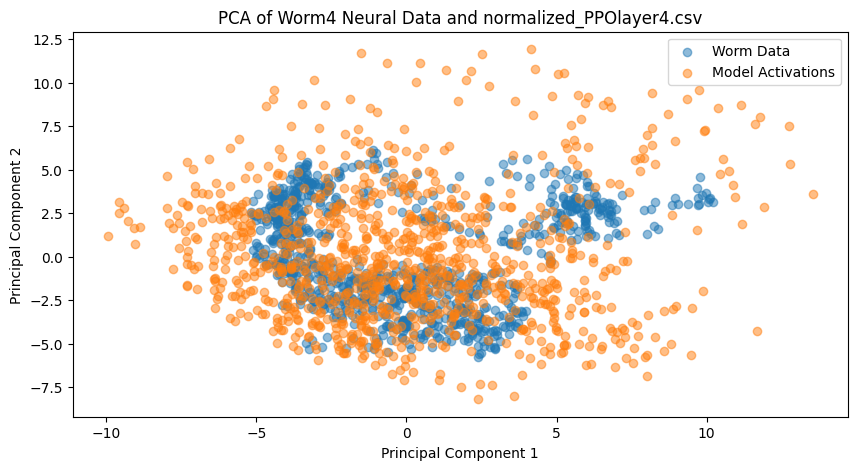

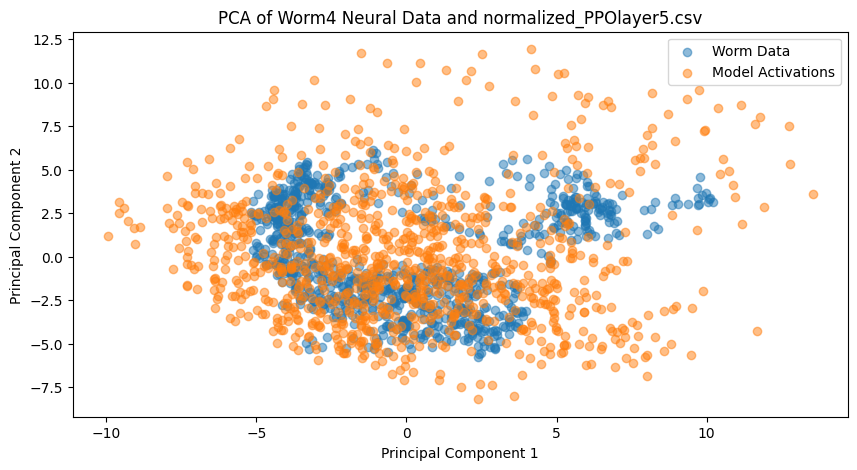

In [15]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


# Function to apply PCA and visualize results
def apply_pca_and_visualize(worm_data, activation_files, worm_file_name, base_path):
    # Initialize PCA
    pca = PCA(n_components=2)

    # Process and compare each activation layer
    for file in activation_files:

        activations_normalized = pd.read_csv(base_path + file)

        activations_pca = pca.fit_transform(activations_normalized)


        worm_data_pca = pca.fit_transform(worm_data)


        plt.figure(figsize=(10, 5))
        plt.scatter(worm_data_pca[:, 0], worm_data_pca[:, 1], label='Worm Data', alpha=0.5)
        plt.scatter(activations_pca[:, 0], activations_pca[:, 1], label='Model Activations', alpha=0.5)
        plt.title(f'PCA of {worm_file_name} Neural Data and {file}')
        plt.xlabel('Principal Component 1')
        plt.ylabel('Principal Component 2')
        plt.legend()
        plt.show()

# Compare each worm data with the activation layers
for worm_file in worm_files:
    worm_file_name = worm_file.replace('normalized_', '').replace('.csv', '')
    apply_pca_and_visualize(worm_data[worm_file], activation_files, worm_file_name, base_path)


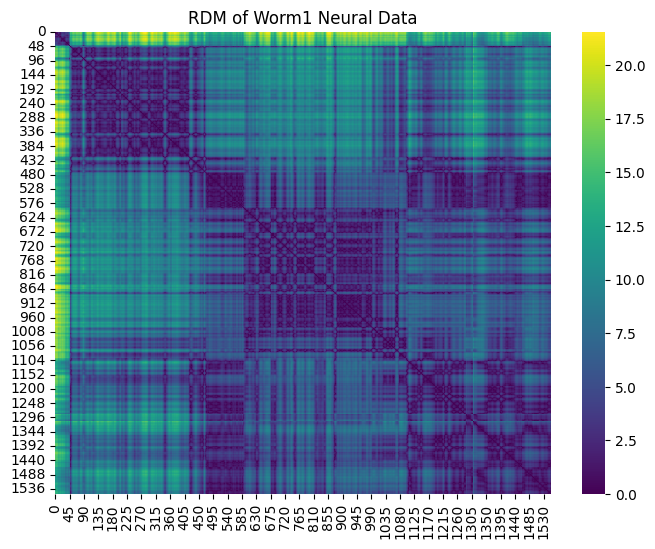

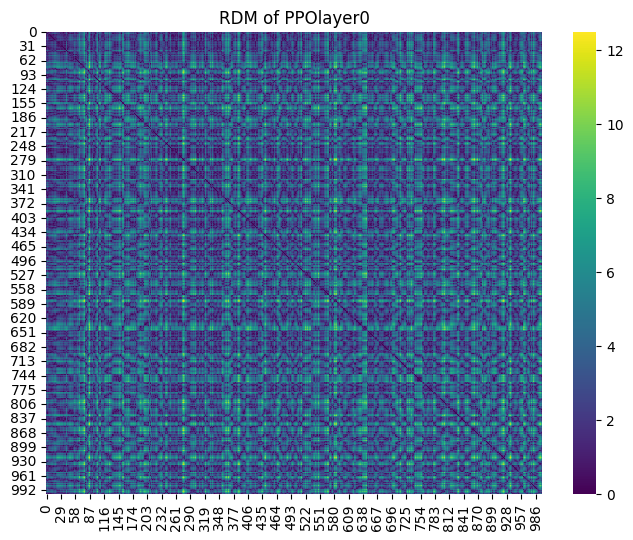

Distances between Worm1 and PPOlayer0:
Spearman: -0.03675625063190764
Kendall: -0.024508072564238034
Cosine: 0.2422159123490344
Manhattan: 4419973.295306832
Minkowski: 667.2787553631105
Jensen-Shannon: 0.28862872411778734


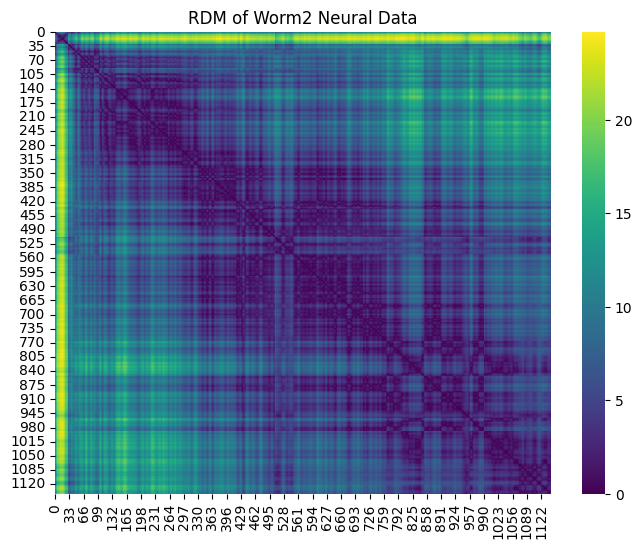

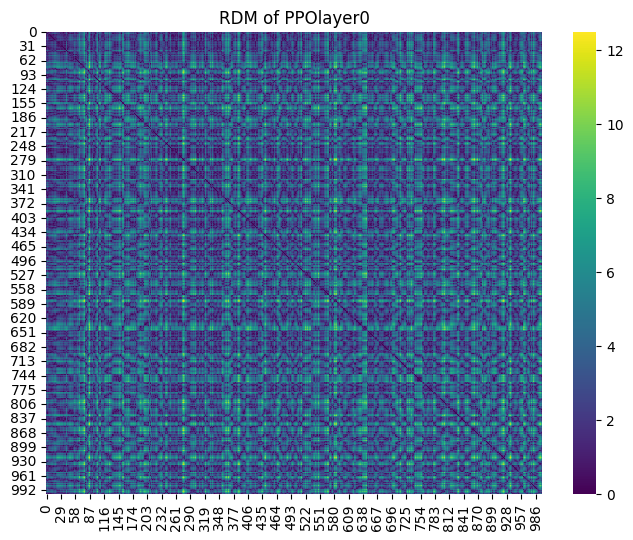

Distances between Worm2 and PPOlayer0:
Spearman: -0.02296132049544992
Kendall: -0.015311572992215956
Cosine: 0.27528577961816325
Manhattan: 4494350.12367295
Minkowski: 756.2503070505106
Jensen-Shannon: 0.304947510639497


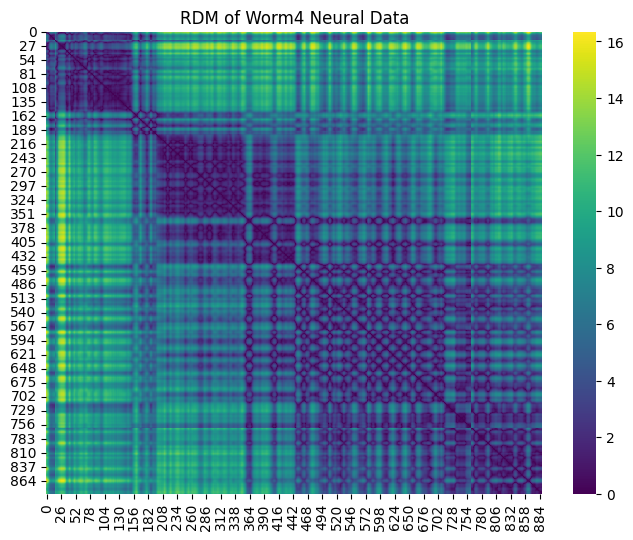

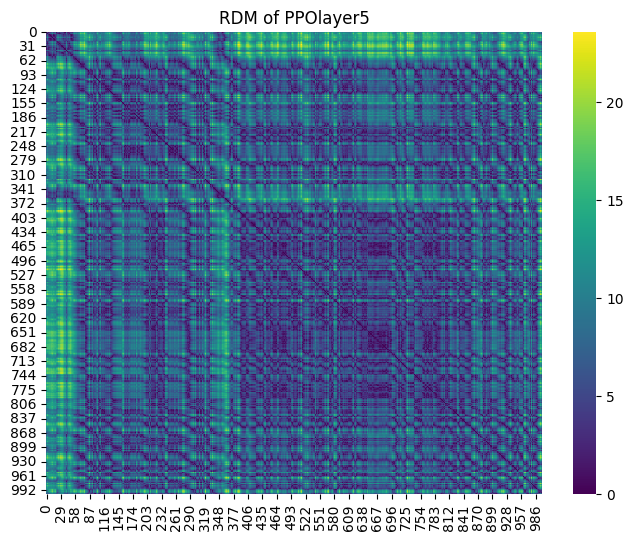

Distances between Worm4 and PPOlayer5:
Spearman: 0.053679799869507
Kendall: 0.035830841766914166
Cosine: 0.2121971566834171
Manhattan: 3128415.0638998114
Minkowski: 543.719635925383
Jensen-Shannon: 0.2741027726660416


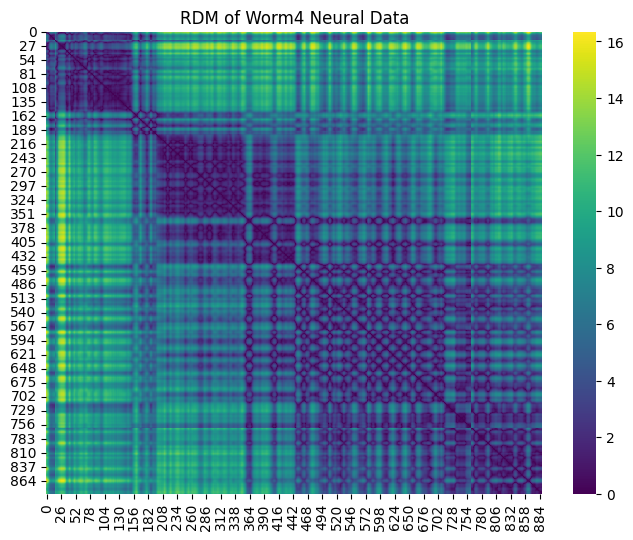

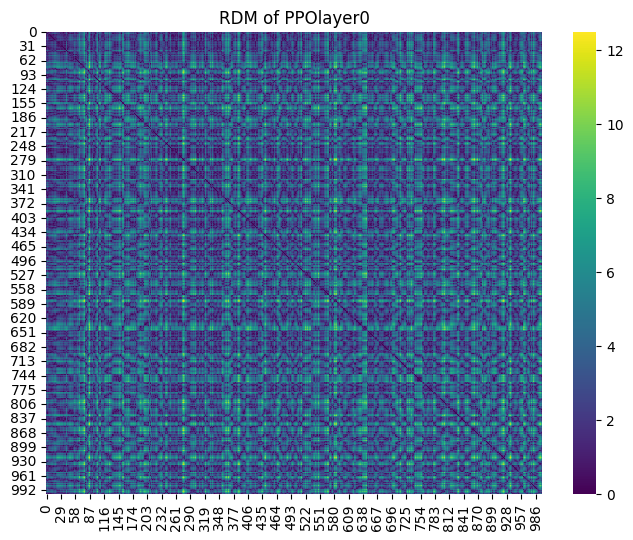

Distances between Worm4 and PPOlayer0:
Spearman: -0.010643343763136056
Kendall: -0.007093294422826591
Cosine: 0.22039032249861956
Manhattan: 2743358.2401541388
Minkowski: 460.2962981751734
Jensen-Shannon: 0.27703832942491025
Worm1 vs PPOlayer0:
Spearman = -0.03675625063190764
Kendall = -0.024508072564238034
Cosine = 0.2422159123490344
Manhattan = 4419973.295306832
Minkowski = 667.2787553631105
Jensen-Shannon = 0.28862872411778734
Worm2 vs PPOlayer0:
Spearman = -0.02296132049544992
Kendall = -0.015311572992215956
Cosine = 0.27528577961816325
Manhattan = 4494350.12367295
Minkowski = 756.2503070505106
Jensen-Shannon = 0.304947510639497
Worm4 vs PPOlayer5:
Spearman = 0.053679799869507
Kendall = 0.035830841766914166
Cosine = 0.2121971566834171
Manhattan = 3128415.0638998114
Minkowski = 543.719635925383
Jensen-Shannon = 0.2741027726660416
Worm4 vs PPOlayer0:
Spearman = -0.010643343763136056
Kendall = -0.007093294422826591
Cosine = 0.22039032249861956
Manhattan = 2743358.2401541388
Minkowski 

In [28]:
import pandas as pd
from sklearn.decomposition import PCA
from scipy.spatial.distance import pdist, squareform, cosine, cityblock, minkowski, jensenshannon
from scipy.stats import spearmanr, kendalltau
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the path to the activation files and worm data files
activation_files = {
    'PPOlayer0': 'normalized_PPOlayer0.csv',
    'PPOlayer5': 'normalized_PPOlayer5.csv'
}

worm_files = {
    'Worm1': 'normalized_Worm1.csv',
    'Worm2': 'normalized_Worm2.csv',
    'Worm4': 'normalized_Worm4.csv'
}

base_path = '/content/'

# Load the normalized neural data for each worm
worm_data = {name: pd.read_csv(base_path + file) for name, file in worm_files.items()}
activation_data = {name: pd.read_csv(base_path + file) for name, file in activation_files.items()}

# Function to apply PCA and compute RDM
def apply_pca_and_compute_rdm(data, n_components=2):
    pca = PCA(n_components=n_components)
    data_pca = pca.fit_transform(data)
    rdm = squareform(pdist(data_pca, metric='euclidean'))
    return rdm

# Function to compute non-linear distance measures
def compute_non_linear_distances(rdm1, rdm2):
    # Flatten the RDMs and ensure they have the same length
    min_length = min(len(rdm1.flatten()), len(rdm2.flatten()))
    rdm1_flat = rdm1.flatten()[:min_length]
    rdm2_flat = rdm2.flatten()[:min_length]

    # Compute various non-linear distances
    spearman_corr, _ = spearmanr(rdm1_flat, rdm2_flat)
    kendall_corr, _ = kendalltau(rdm1_flat, rdm2_flat)
    cosine_sim = cosine(rdm1_flat, rdm2_flat)
    manhattan_dist = cityblock(rdm1_flat, rdm2_flat)
    minkowski_dist = minkowski(rdm1_flat, rdm2_flat, p=3)  # p can be varied
    js_divergence = jensenshannon(rdm1_flat, rdm2_flat)

    return {
        'Spearman': spearman_corr,
        'Kendall': kendall_corr,
        'Cosine': cosine_sim,
        'Manhattan': manhattan_dist,
        'Minkowski': minkowski_dist,
        'Jensen-Shannon': js_divergence
    }

# Function to visualize RDMs and compute correlations
def visualize_and_compute_correlations(worm_rdm, activation_rdm, worm_name, layer_name):
    # Plot the worm RDM
    plt.figure(figsize=(8, 6))
    sns.heatmap(worm_rdm, cmap='viridis', cbar=True)
    plt.title(f'RDM of {worm_name} Neural Data')
    plt.show()

    # Plot the activation RDM
    plt.figure(figsize=(8, 6))
    sns.heatmap(activation_rdm, cmap='viridis', cbar=True)
    plt.title(f'RDM of {layer_name}')
    plt.show()

    # Compute non-linear distances
    distances = compute_non_linear_distances(worm_rdm, activation_rdm)

    print(f'Distances between {worm_name} and {layer_name}:')
    for key, value in distances.items():
        print(f'{key}: {value}')

    return distances

# Pairs to compare
pairs_to_compare = [
    ('Worm1', 'PPOlayer0'),
    ('Worm2', 'PPOlayer0'),
    ('Worm4', 'PPOlayer5'),
    ('Worm4', 'PPOlayer0')
]

# Store results
results = []

# Perform layer-wise comparison
for worm_name, layer_name in pairs_to_compare:
    worm_rdm = apply_pca_and_compute_rdm(worm_data[worm_name])
    activation_rdm = apply_pca_and_compute_rdm(activation_data[layer_name])
    distances = visualize_and_compute_correlations(worm_rdm, activation_rdm, worm_name, layer_name)
    results.append((worm_name, layer_name, distances))

# Print summary of results
for worm_name, layer_name, distances in results:
    print(f'{worm_name} vs {layer_name}:')
    for key, value in distances.items():
        print(f'{key} = {value}')
